Here I am using up-to-date COVID-19 data for London here https://data.london.gov.uk/dataset/coronavirus--covid-19--cases

Public Health England (PHE) publish daily updated data on confirmed cases of COVID-19. This note provides a summary of the key data for London from this release alongside related data published by NHS and Office of National Statistics (ONS).

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# interactive visualization
import plotly.express as px

In [2]:
covid_london= pd.read_csv('phe_cases_london_boroughs.csv')

In [3]:
covid_london.head()

,area_name,area_code,date,new_cases,total_cases
0,Barking and Dagenham,E09000002,2020-02-11,0,0
1,Barnet,E09000003,2020-02-11,0,0
2,Bexley,E09000004,2020-02-11,0,0
3,Brent,E09000005,2020-02-11,0,0
4,Bromley,E09000006,2020-02-11,0,0


In [4]:
covid_london.date=pd.to_datetime(covid_london.date)

In [5]:
covid_london.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10112 entries, 0 to 10111
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   area_name    10112 non-null  object        
 1   area_code    10112 non-null  object        
 2   date         10112 non-null  datetime64[ns]
 3   new_cases    10112 non-null  int64         
 4   total_cases  10112 non-null  int64         
dtypes: datetime64[ns](1), int64(2), object(2)
memory usage: 395.1+ KB


In [6]:
#all London areas affected by COVID-19
covid_london['area_name'].unique()

array(['Barking and Dagenham', 'Barnet', 'Bexley', 'Brent', 'Bromley',
       'Camden', 'Croydon', 'Ealing', 'Enfield', 'Greenwich',
       'Hackney and City of London', 'Hammersmith and Fulham', 'Haringey',
       'Harrow', 'Havering', 'Hillingdon', 'Hounslow', 'Islington',
       'Kensington and Chelsea', 'Kingston upon Thames', 'Lambeth',
       'Lewisham', 'Merton', 'Newham', 'Redbridge',
       'Richmond upon Thames', 'Southwark', 'Sutton', 'Tower Hamlets',
       'Waltham Forest', 'Wandsworth', 'Westminster'], dtype=object)

In [7]:
total_cases_per_day=covid_london.groupby(['date', 'area_name'])['new_cases'].sum().reset_index()
total_cases_per_day.head()

,date,area_name,new_cases
0,2020-02-11,Barking and Dagenham,0
1,2020-02-11,Barnet,0
2,2020-02-11,Bexley,0
3,2020-02-11,Brent,0
4,2020-02-11,Bromley,0


In [8]:
fig = px.area(total_cases_per_day, x="date", y="new_cases", height=600, width=700,
             title='Cases over time')
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [9]:
total_cases_per_day_area=covid_london.groupby(['date', 'area_name'])['new_cases'].sum().reset_index()

In [10]:
import geopandas as gpd
from descartes import PolygonPatch
import plotly.express as px

In [11]:
london_map=gpd.read_file('london_boroughs.json')
london_map.head()

,id,name,code,area_hectares,inner_statistical,geometry
0,1,Kingston upon Thames,E09000021,3726.117,False,"MULTIPOLYGON (((-0.33068 51.32901, -0.33059 51..."
1,2,Croydon,E09000008,8649.441,False,"MULTIPOLYGON (((-0.06402 51.31864, -0.06408 51..."
2,3,Bromley,E09000006,15013.487,False,"MULTIPOLYGON (((0.01213 51.29960, 0.01196 51.2..."
3,4,Hounslow,E09000018,5658.541,False,"MULTIPOLYGON (((-0.24456 51.48870, -0.24468 51..."
4,5,Ealing,E09000009,5554.428,False,"MULTIPOLYGON (((-0.41183 51.53408, -0.41188 51..."


In [26]:
total_cases_per_day.head()

,date,area_name,new_cases
0,2020-02-11,Barking and Dagenham,0
1,2020-02-11,Barnet,0
2,2020-02-11,Bexley,0
3,2020-02-11,Brent,0
4,2020-02-11,Bromley,0


In [21]:
import geoplot as gplt
import geopandas as gpd
import geoplot.crs as gcrs
import imageio
import pandas as pd
import pathlib
import matplotlib.pyplot as plt
import mapclassify as mc
import numpy as np

In [28]:
fig = px.choropleth(total_cases_per_day, geojson=london_map, locations='area_name',
                    color='new_cases', color_continuous_scale="Viridis", scope='europe',
                    range_color=(0, 12))

fig.show()

In [13]:
total_cases_per_day.head()

,date,area_name,new_cases
0,2020-02-11,Barking and Dagenham,0
1,2020-02-11,Barnet,0
2,2020-02-11,Bexley,0
3,2020-02-11,Brent,0
4,2020-02-11,Bromley,0


In [14]:
cases_per_borough=total_cases_per_day.groupby(['area_name']).sum()
cases_per_borough

,new_cases
area_name,
Barking and Dagenham,8918
Barnet,11400
Bexley,9373
Brent,9863
Bromley,9651
Camden,5575
Croydon,10727
Ealing,11267
Enfield,11878


In [15]:
fin_map=london_map.merge(cases_per_borough, left_on='name', right_on='area_name', how='outer')
fin_map.head()

,id,name,code,area_hectares,inner_statistical,geometry,new_cases
0,1.0,Kingston upon Thames,E09000021,3726.117,False,"MULTIPOLYGON (((-0.33068 51.32901, -0.33059 51...",5342.0
1,2.0,Croydon,E09000008,8649.441,False,"MULTIPOLYGON (((-0.06402 51.31864, -0.06408 51...",10727.0
2,3.0,Bromley,E09000006,15013.487,False,"MULTIPOLYGON (((0.01213 51.29960, 0.01196 51.2...",9651.0
3,4.0,Hounslow,E09000018,5658.541,False,"MULTIPOLYGON (((-0.24456 51.48870, -0.24468 51...",8318.0
4,5.0,Ealing,E09000009,5554.428,False,"MULTIPOLYGON (((-0.41183 51.53408, -0.41188 51...",11267.0


In [16]:
import matplotlib.cm as cm

In [17]:
import geoplot as gplt
import geopandas as gpd

<AxesSubplot:>

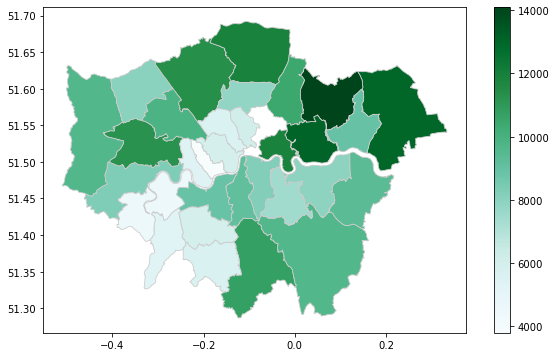

In [18]:
# create figure and axes for Matplotlib
fig, ax = plt.subplots(figsize=(10, 6))

fin_map.plot(column='new_cases', cmap='BuGn', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)